# Secretária de Segurança Pública - Ocorrências Criminais

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

criminal_2022 = pd.read_csv('../data/ocorrencia_criminal_sjc_2022.csv', low_memory=False, delimiter=';')
criminal_2023 = pd.read_csv('../data/ocorrencia_criminal_sjc_2023.csv', low_memory=False, delimiter=';')
criminal_2024 = pd.read_csv('../data/ocorrencia_criminal_sjc_2024.csv', low_memory=False, delimiter=';')


In [21]:
# Dicionário de mapeamento dos meses para a forma abreviada
mapa_meses = {
    'Janeiro': 'Jan', 'Fevereiro': 'Fev', 'Marco': 'Mar', 'Abril': 'Abr', 'Maio': 'Mai', 'Junho': 'Jun',
    'Julho': 'Jul', 'Agosto': 'Ago', 'Setembro': 'Set', 'Outubro': 'Out', 'Novembro': 'Nov', 'Dezembro': 'Dez'
}

# Função para renomear as colunas de meses e adicionar o ano
def renomear_e_adicionar_ano(df, ano, remover_meses=None):
    # Renomear as colunas dos meses para a forma abreviada
    df = df.rename(columns=mapa_meses)
    # Remover meses indesejados, se especificado
    if remover_meses:
        df = df.drop(columns=remover_meses, errors='ignore')
    # Adicionar o ano ao nome dos meses restantes
    df.columns = [col if col not in mapa_meses.values() else f"{col}/{ano}" for col in df.columns]
    return df

# Meses a serem removidos para 2024 (Julho em diante)
meses_para_remover = ['Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

# Aplicando a função para cada DataFrame
criminal_2022 = renomear_e_adicionar_ano(criminal_2022, 2022)
criminal_2023 = renomear_e_adicionar_ano(criminal_2023, 2023)
criminal_2024 = renomear_e_adicionar_ano(criminal_2024, 2024, remover_meses=[mapa_meses[mes] for mes in meses_para_remover])


In [22]:
criminal_2022

,Natureza,Jan/2022,Fev/2022,Mar/2022,Abr/2022,Mai/2022,Jun/2022,Jul/2022,Ago/2022,Set/2022,Out/2022,Nov/2022,Dez/2022,Total
0,HOMICÍDIO DOLOSO (2),5,1,4,2,4,8,4,4,4,3,3,4,46.000
1,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO (3),5,1,4,2,4,8,4,4,4,3,4,4,47.000
2,HOMICÍDIO DOLOSO POR ACIDENTE DE TRÂNSITO,0,0,0,0,0,0,0,0,0,0,0,0,0.000
3,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO POR ACIDENTE...,0,0,0,0,0,0,0,0,0,0,0,0,0.000
4,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,3,4,1,2,5,7,3,3,2,5,3,5,43.000
5,HOMICÍDIO CULPOSO OUTROS,0,0,0,1,0,0,0,0,0,0,0,0,1.000
6,TENTATIVA DE HOMICÍDIO,6,5,6,3,4,4,7,4,5,8,1,9,62.000
7,LESÃO CORPORAL SEGUIDA DE MORTE,0,0,0,0,0,0,1,0,0,0,0,0,1.000
8,LESÃO CORPORAL DOLOSA,155,158,176,157,158,142,144,180,149,148,143,162,1.872
9,LESÃO CORPORAL CULPOSA POR ACIDENTE DE TRÂNSITO,47,41,68,58,68,77,66,64,52,59,72,62,734.000


In [23]:
criminal_2023

,Natureza,Jan/2023,Fev/2023,Mar/2023,Abr/2023,Mai/2023,Jun/2023,Jul/2023,Ago/2023,Set/2023,Out/2023,Nov/2023,Dez/2023,Total
0,HOMICÍDIO DOLOSO (2),2,4,4,4,4,4,3,3,3,3,3,7,44.000
1,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO (3),2,4,4,4,4,4,3,3,3,3,3,7,44.000
2,HOMICÍDIO DOLOSO POR ACIDENTE DE TRÂNSITO,0,0,0,0,0,0,0,0,0,0,0,0,0.000
3,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO POR ACIDENTE...,0,0,0,0,0,0,0,0,0,0,0,0,0.000
4,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,4,4,6,4,8,2,7,4,6,3,3,5,56.000
5,HOMICÍDIO CULPOSO OUTROS,0,0,0,0,1,0,1,0,0,0,0,0,2.000
6,TENTATIVA DE HOMICÍDIO,4,6,7,2,3,5,6,5,4,2,3,4,51.000
7,LESÃO CORPORAL SEGUIDA DE MORTE,0,0,0,0,0,0,0,0,1,0,0,0,1.000
8,LESÃO CORPORAL DOLOSA,145,162,168,173,168,148,149,179,182,182,186,195,2.037
9,LESÃO CORPORAL CULPOSA POR ACIDENTE DE TRÂNSITO,66,57,83,68,87,86,68,110,72,58,79,75,909.000


In [24]:
criminal_2024

,Natureza,Jan/2024,Fev/2024,Mar/2024,Abr/2024,Mai/2024,Jun/2024,Total
0,HOMICÍDIO DOLOSO (2),1,3,2,1,3,4,14.000
1,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO (3),1,3,2,1,3,4,14.000
2,HOMICÍDIO DOLOSO POR ACIDENTE DE TRÂNSITO,0,0,0,0,0,0,0.000
3,Nº DE VÍTIMAS EM HOMICÍDIO DOLOSO POR ACIDENTE...,0,0,0,0,0,0,0.000
4,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,6,4,4,6,8,2,30.000
5,HOMICÍDIO CULPOSO OUTROS,0,0,0,0,0,0,0.000
6,TENTATIVA DE HOMICÍDIO,0,2,5,7,2,8,24.000
7,LESÃO CORPORAL SEGUIDA DE MORTE,0,0,1,0,0,1,2.000
8,LESÃO CORPORAL DOLOSA,189,188,192,173,149,155,1.046
9,LESÃO CORPORAL CULPOSA POR ACIDENTE DE TRÂNSITO,72,76,71,54,83,109,465.000


In [25]:
# Remover a coluna 'Total' se existir
criminal_2022 = criminal_2022.drop(columns=['Total', 'Ano'], errors='ignore')
criminal_2023 = criminal_2023.drop(columns=['Total', 'Ano'], errors='ignore')
criminal_2024 = criminal_2024.drop(columns=['Total', 'Ano'], errors='ignore')

# Concatenando os três DataFrames
dados_concatenados = pd.concat([criminal_2022, criminal_2023, criminal_2024])

# Agrupando pelos crimes (Natureza) e somando as ocorrências ao longo dos meses/anos
dados_agrupados = dados_concatenados.groupby('Natureza').sum()

dados_agrupados

,Jan/2022,Fev/2022,Mar/2022,Abr/2022,Mai/2022,Jun/2022,Jul/2022,Ago/2022,Set/2022,Out/2022,...,Set/2023,Out/2023,Nov/2023,Dez/2023,Jan/2024,Fev/2024,Mar/2024,Abr/2024,Mai/2024,Jun/2024
Natureza,,,,,,,,,,,,,,,,,,,,,
ESTUPRO,4.0,3.0,2.0,2.0,1.0,1.0,2.0,3.0,4.0,4.0,...,5.0,6.0,3.0,6.0,5.0,4.0,3.0,5.0,6.0,4.0
ESTUPRO DE VULNERÁVEL,5.0,6.0,11.0,5.0,9.0,4.0,4.0,16.0,10.0,3.0,...,10.0,5.0,9.0,15.0,8.0,7.0,5.0,8.0,13.0,14.0
FURTO - OUTROS,369.0,378.0,482.0,453.0,539.0,482.0,345.0,568.0,552.0,563.0,...,474.0,500.0,489.0,411.0,517.0,401.0,450.0,440.0,405.0,425.0
FURTO DE VEÍCULO,76.0,98.0,109.0,102.0,98.0,105.0,117.0,116.0,126.0,116.0,...,57.0,80.0,97.0,83.0,78.0,59.0,44.0,51.0,46.0,51.0
HOMICÍDIO CULPOSO OUTROS,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,3.0,4.0,1.0,2.0,5.0,7.0,3.0,3.0,2.0,5.0,...,6.0,3.0,3.0,5.0,6.0,4.0,4.0,6.0,8.0,2.0
HOMICÍDIO DOLOSO (2),5.0,1.0,4.0,2.0,4.0,8.0,4.0,4.0,4.0,3.0,...,3.0,3.0,3.0,7.0,1.0,3.0,2.0,1.0,3.0,4.0
HOMICÍDIO DOLOSO POR ACIDENTE DE TRÂNSITO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LATROCÍNIO,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [26]:
# Texto do rodapé
rodape = """
FONTE: Departamento de Polícia Civil, Polícia Militar e Superintendência da Polícia Técnico-Científica
(1) Soma de Roubo - Outros, Roubo de Carga e Roubo a Banco.
(2) Homicídio Doloso inclui Homicídio Doloso por Acidente de Trânsito.
(3) Nº de Vítimas de Homicídio Doloso inclui Nº de Vítimas de Homicídio Doloso por Acidente de Trânsito.
(4) Soma de Estupro e Estupro de Vulnerável.
(…) Dados não disponíveis.
Os dados estatísticos do Estado de São Paulo são divulgados nesta página em data anterior à publicação oficial em Diário Oficial do Estado (Lei Estadual nº 9.155/95 e Resolução SSP nº 161/01). No período compreendido entre a divulgação inicial e a publicação oficial em Diário Oficial, há possibilidade de retificações que são atualizadas automaticamente nesta página.
"""

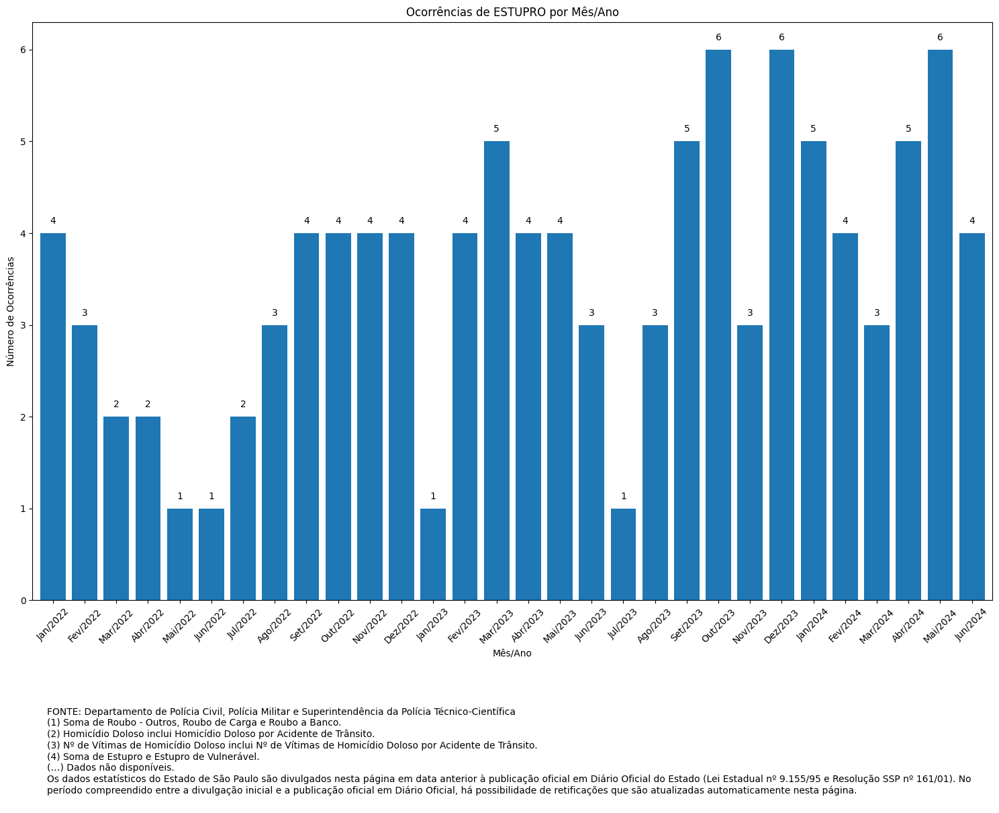

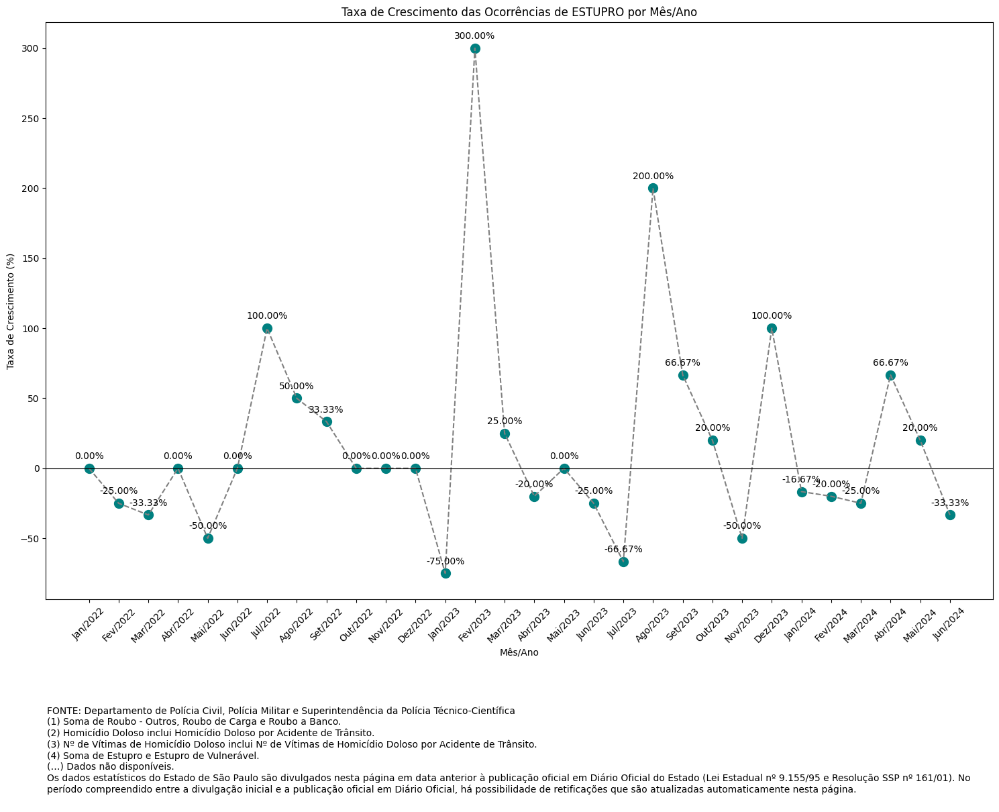

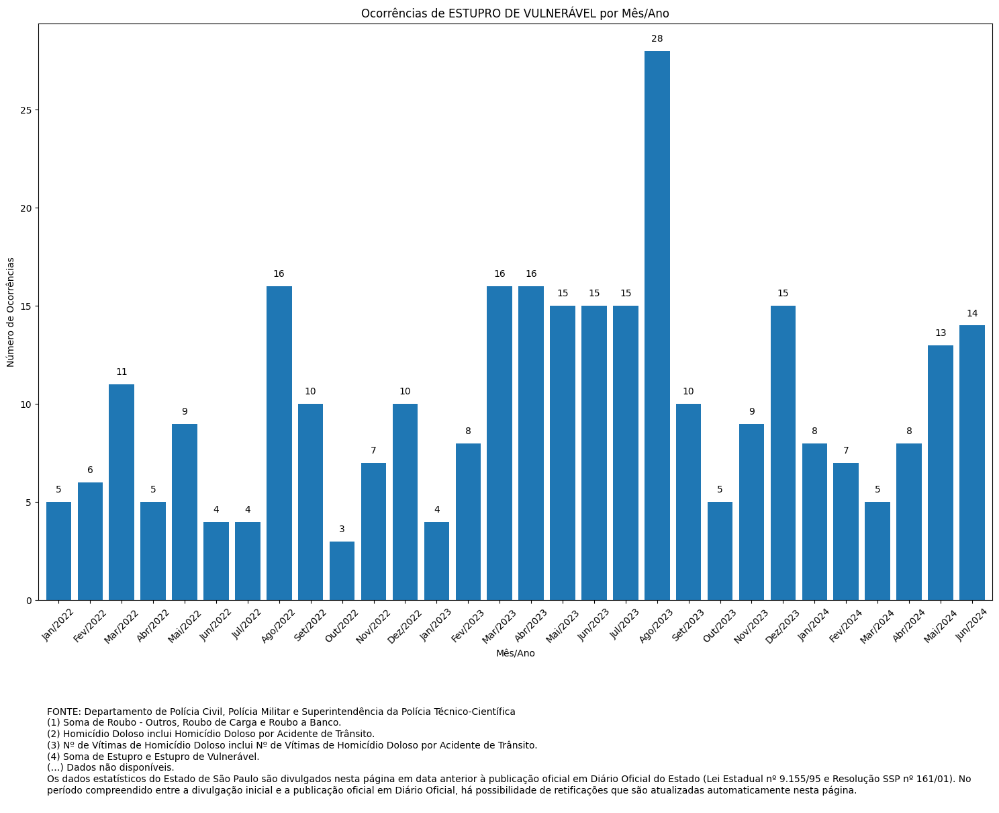

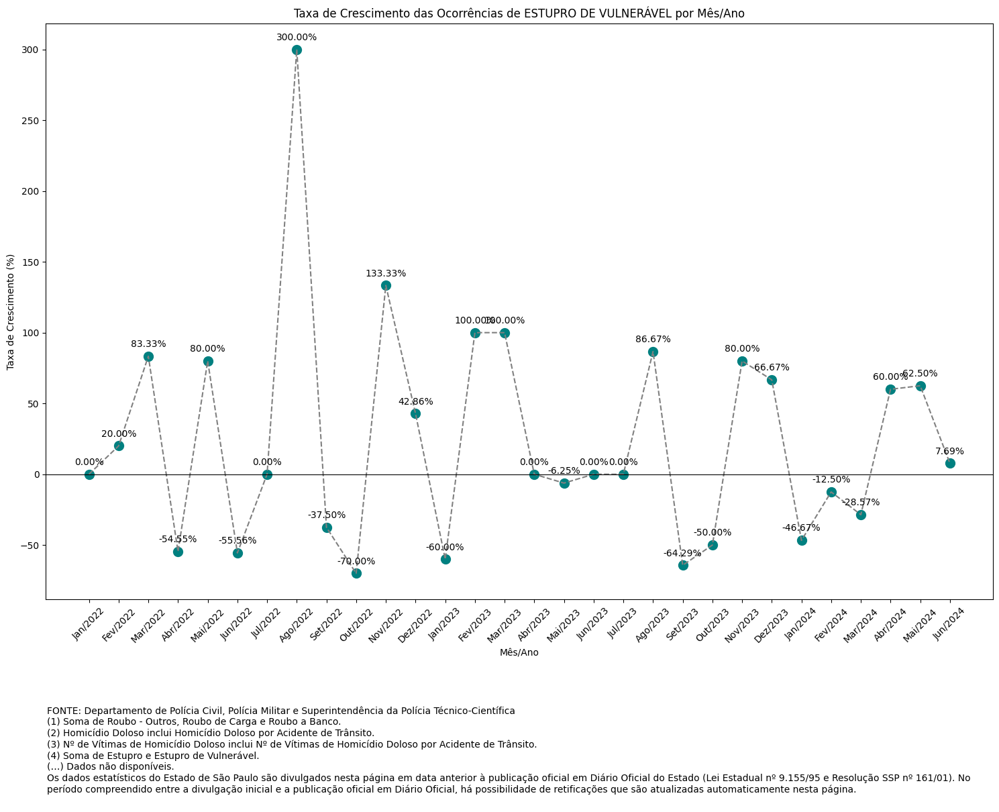

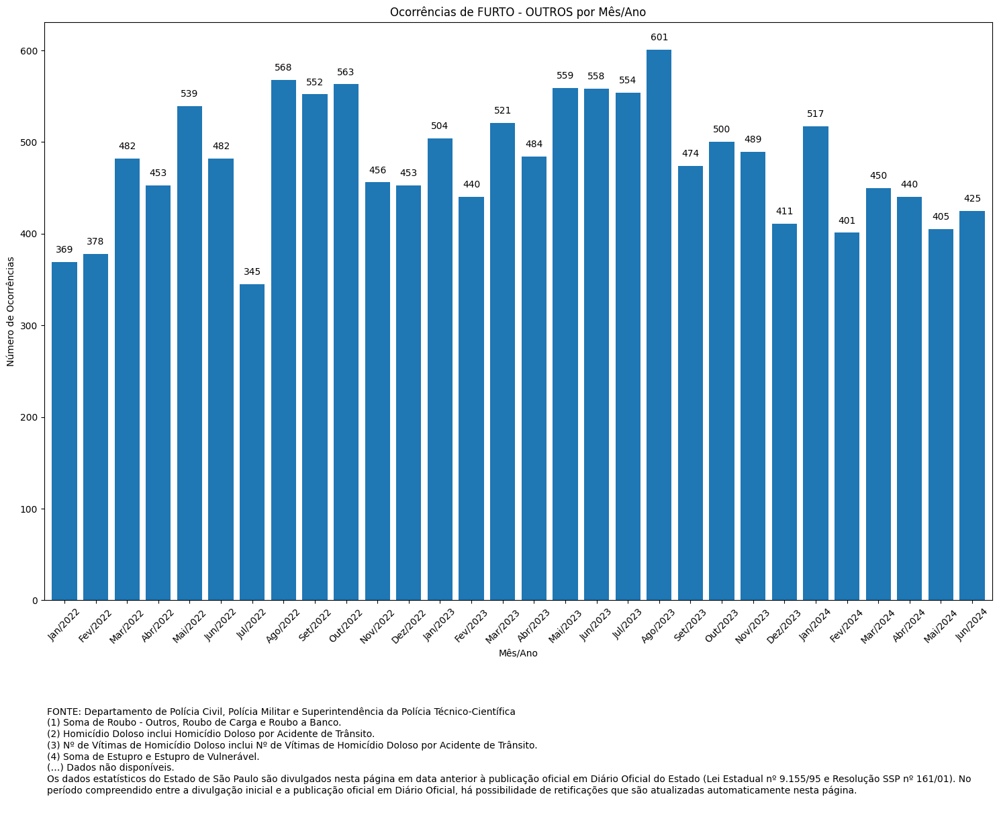

...

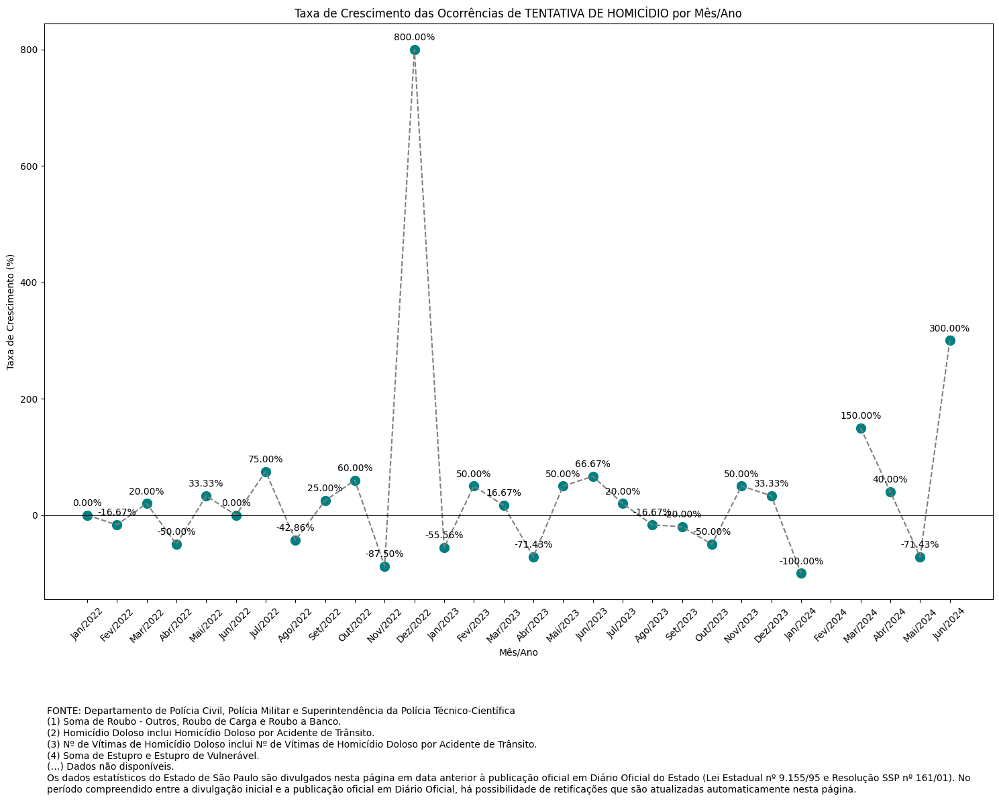

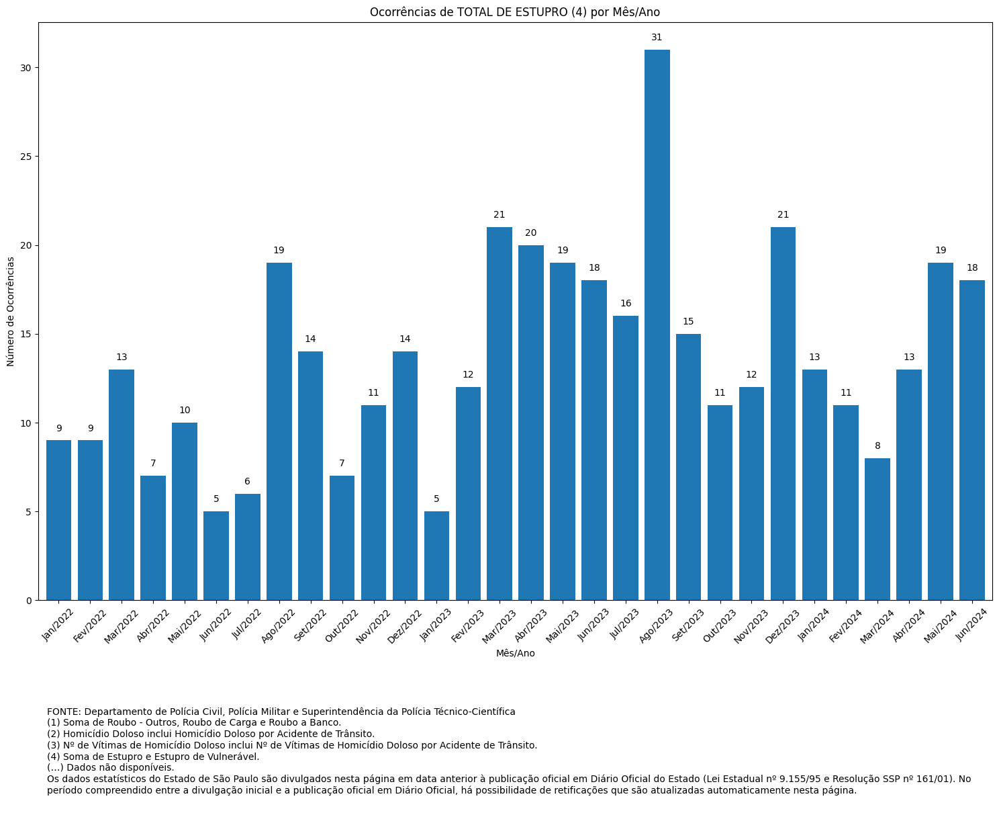

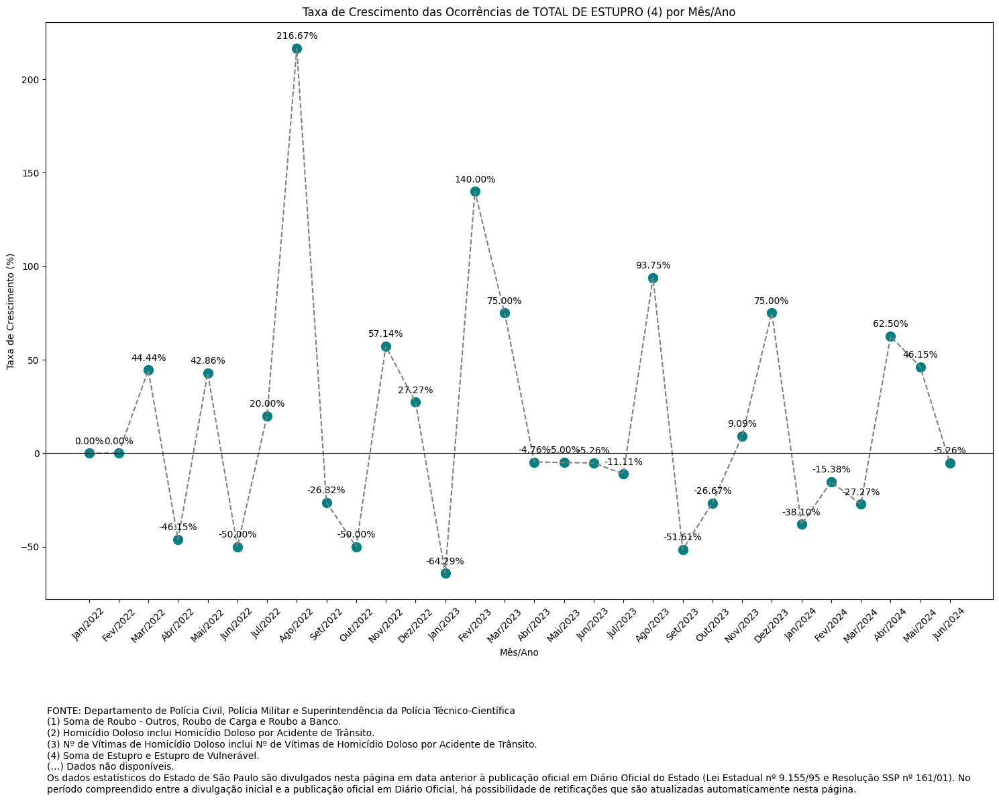

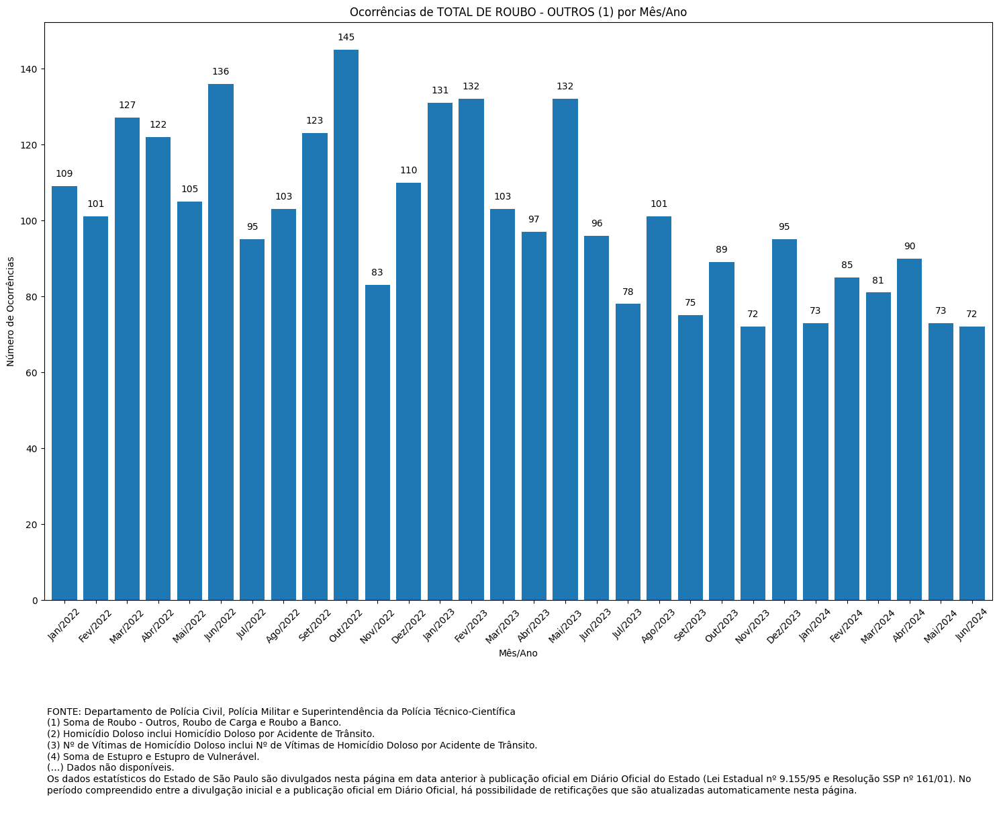

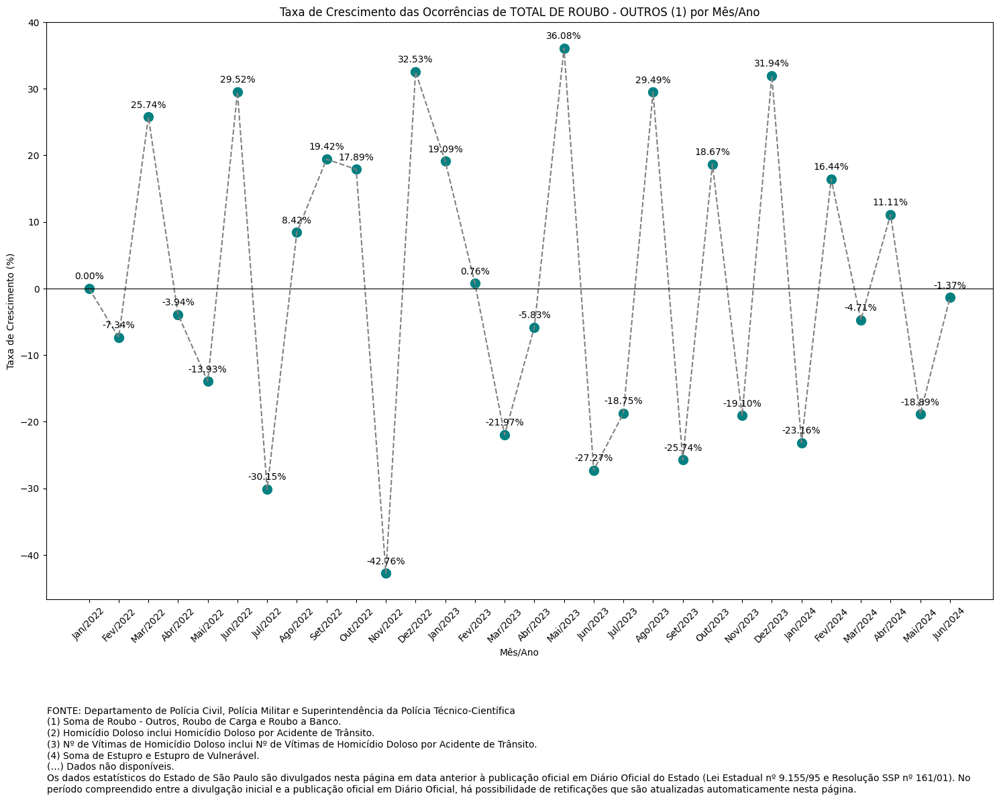

In [27]:
# Função para gerar o gráfico de ocorrências por mês/ano
def plot_ocorrencias_por_natureza(natureza, dados_agrupados):
    lesao_corporal_dolosa = dados_agrupados.loc[natureza].to_frame().T
    lesao_corporal_dolosa = lesao_corporal_dolosa.T  # Transpor os dados para ter mês/ano como índice
    
    ax = lesao_corporal_dolosa.plot(kind='bar', figsize=(15, 10), legend=False, width=0.8)
    plt.title(f'Ocorrências de {natureza} por Mês/Ano')
    plt.xlabel('Mês/Ano')
    plt.ylabel('Número de Ocorrências')
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Adicionando os valores em cima de cada barra
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', 
                    xytext=(0, 8), 
                    textcoords='offset points',
                    fontsize=10)

    # Adicionando o rodapé
    plt.figtext(0.05, -0.2, rodape, wrap=True, horizontalalignment='left', fontsize=10)
    plt.show()

# Função para gerar o gráfico de taxa de crescimento
def plot_taxa_crescimento(natureza, dados_agrupados):
    lesao_corporal_dolosa = dados_agrupados.loc[natureza].to_frame().T
    lesao_corporal_dolosa = lesao_corporal_dolosa.T  # Transpor os dados para ter mês/ano como índice
    
    taxa_crescimento = lesao_corporal_dolosa.pct_change().fillna(0) * 100
    
    plt.figure(figsize=(15, 10))
    plt.scatter(taxa_crescimento.index, taxa_crescimento.iloc[:, 0], color='teal', s=100)
    plt.plot(taxa_crescimento.index, taxa_crescimento.iloc[:, 0], linestyle='--', color='gray')
    plt.title(f'Taxa de Crescimento das Ocorrências de {natureza} por Mês/Ano')
    plt.xlabel('Mês/Ano')
    plt.ylabel('Taxa de Crescimento (%)')
    plt.xticks(rotation=45)
    plt.axhline(0, color='black', linewidth=0.8)
    plt.tight_layout()

    # Adicionando os valores em cima de cada ponto
    for i, txt in enumerate(taxa_crescimento.iloc[:, 0]):
        plt.annotate(f'{txt:.2f}%', (taxa_crescimento.index[i], taxa_crescimento.iloc[i, 0]),
                     textcoords="offset points", xytext=(0,10), ha='center', fontsize=10)
        
    # Adicionando o rodapé
    plt.figtext(0.05, -0.2, rodape, wrap=True, horizontalalignment='left', fontsize=10)
    plt.show()

# Iterando sobre cada "Natureza" para gerar os gráficos
for natureza in dados_agrupados.index:
    plot_ocorrencias_por_natureza(natureza, dados_agrupados)
    plot_taxa_crescimento(natureza, dados_agrupados)